The Project
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob
import cv2
%matplotlib inline

Camera calibration and distortion coefficients
---

### Extracting chessboard points for calibration


In [2]:

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
detected = []
undetected = []


# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    # If found, add object points, image points
    if ret == True:
        detected.append(fname)
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
    else:
        undetected.append(fname)
     
cv2.destroyAllWindows()
cv2.waitKey(500)

print('Files where chessboard was detected')
print(detected)
print('Files where chessboard was not detected')
print(undetected)

Files where chessboard was detected
['./camera_cal/calibration6.jpg', './camera_cal/calibration7.jpg', './camera_cal/calibration3.jpg', './camera_cal/calibration2.jpg', './camera_cal/calibration20.jpg', './camera_cal/calibration19.jpg', './camera_cal/calibration18.jpg', './camera_cal/calibration15.jpg', './camera_cal/calibration14.jpg', './camera_cal/calibration16.jpg', './camera_cal/calibration17.jpg', './camera_cal/calibration13.jpg', './camera_cal/calibration12.jpg', './camera_cal/calibration10.jpg', './camera_cal/calibration11.jpg', './camera_cal/calibration9.jpg', './camera_cal/calibration8.jpg']
Files where chessboard was not detected
['./camera_cal/calibration5.jpg', './camera_cal/calibration4.jpg', './camera_cal/calibration1.jpg']


### Camera calibration

In [3]:
print('Using shape from ' + fname + ' for camera calibration: ' + str(img.shape) )
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

Using shape from ./camera_cal/calibration8.jpg for camera calibration: (720, 1280, 3)


In [4]:
def cal_undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

### Previewing undistortion with test image

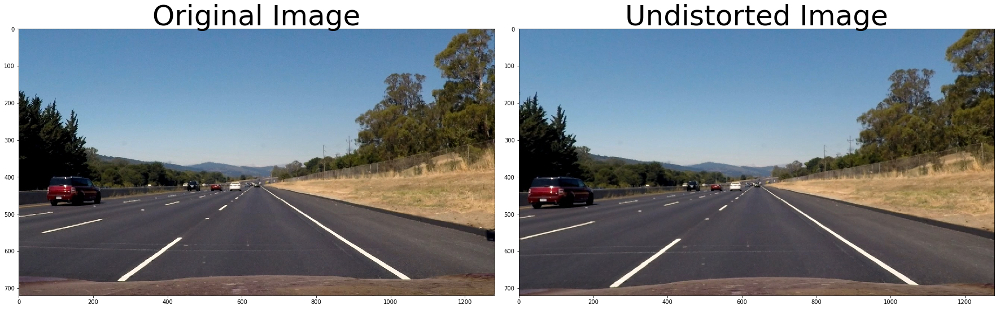

In [5]:
test_img = cv2.imread('test_images/straight_lines2.jpg')
test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
undistorted = cal_undistort(test_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Create a thresholded binary image.

In [6]:
def to_binary_img(img, s_thresh=(170, 255), sx_thresh=(30, 90), l_thresh=(20, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold lightness channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Stack each channel
    # color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    return (s_binary | sxbinary) & l_binary;
    

In [7]:
def test_previous_pipeline1(fname, s_thresh=(170, 255), sx_thresh=(40, 120), l_thresh=(30, 255)):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
    undistorted = cal_undistort(test_img)
    binary_img = to_binary_img(undistorted, s_thresh, sx_thresh, l_thresh)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(undistorted)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(binary_img, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

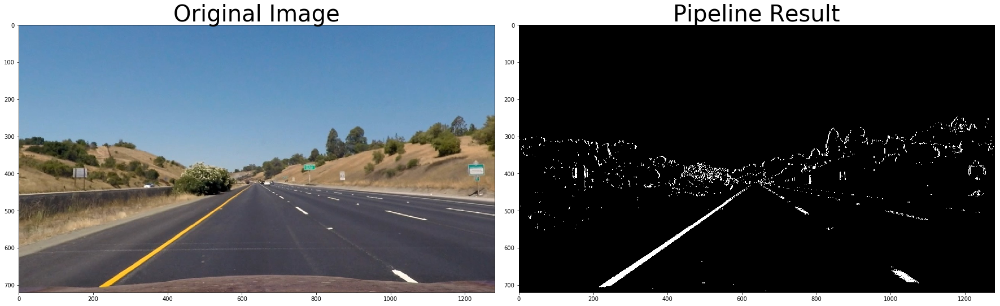

In [8]:
test_previous_pipeline1('test_images/straight_lines1.jpg')

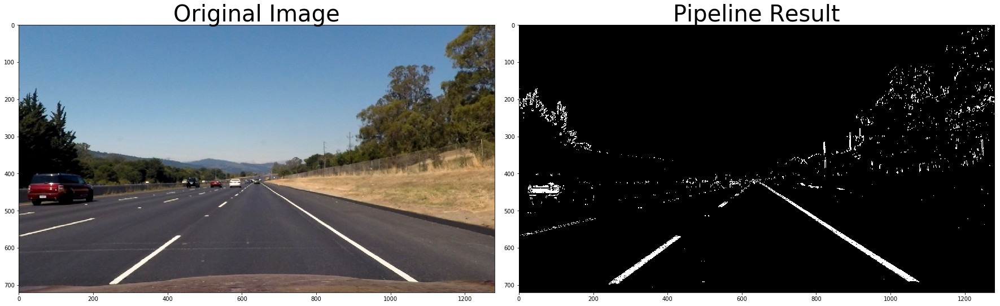

In [9]:
test_previous_pipeline1('test_images/straight_lines2.jpg')

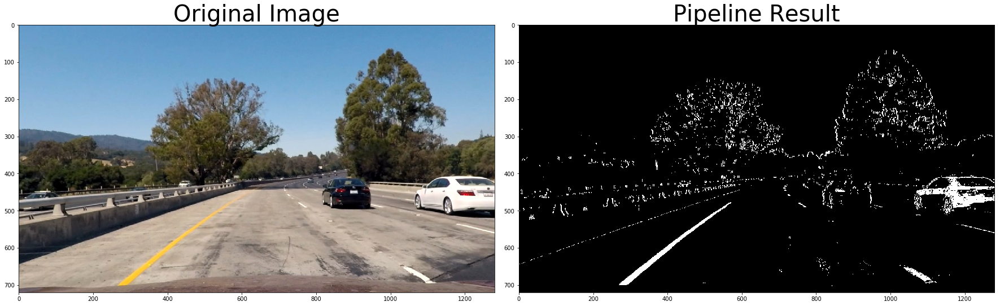

In [10]:
test_previous_pipeline1('test_images/test1.jpg')

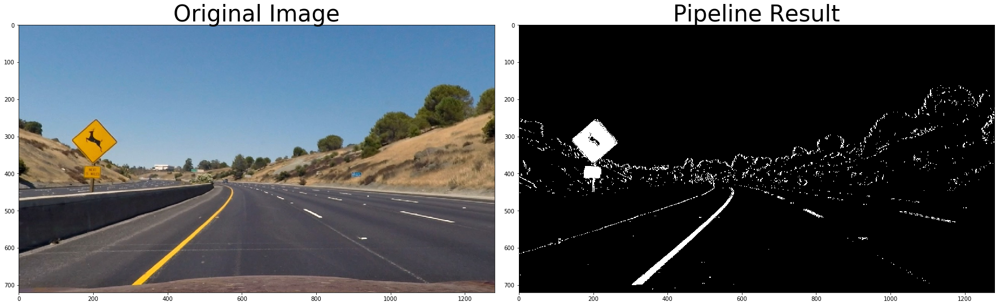

In [11]:
test_previous_pipeline1('test_images/test2.jpg')

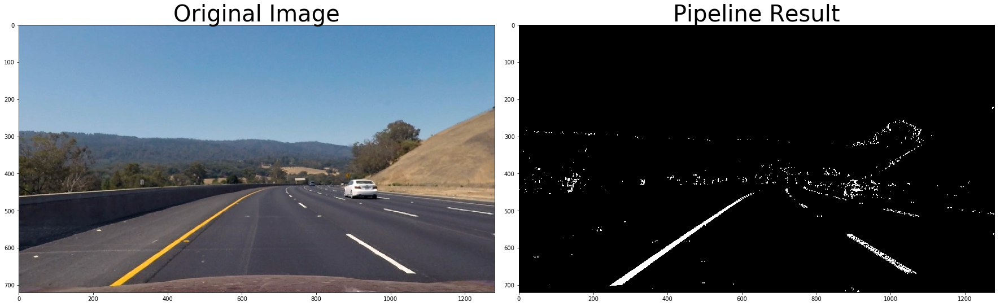

In [12]:
test_previous_pipeline1('test_images/test3.jpg')

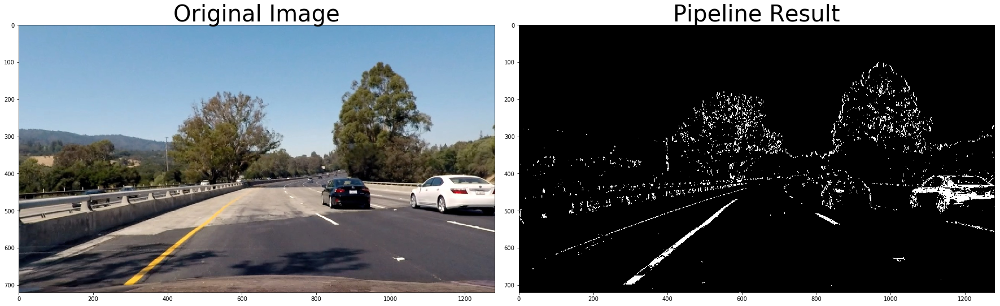

In [13]:
test_previous_pipeline1('test_images/test4.jpg')

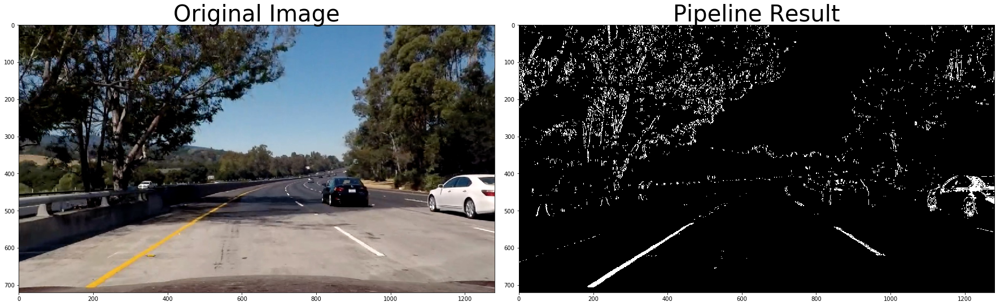

In [14]:
test_previous_pipeline1('test_images/test5.jpg')

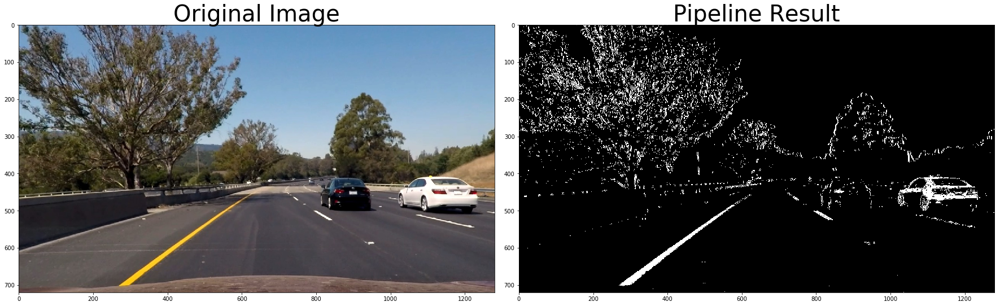

In [15]:
test_previous_pipeline1('test_images/test6.jpg', s_thresh=(170, 255), sx_thresh=(40, 120))

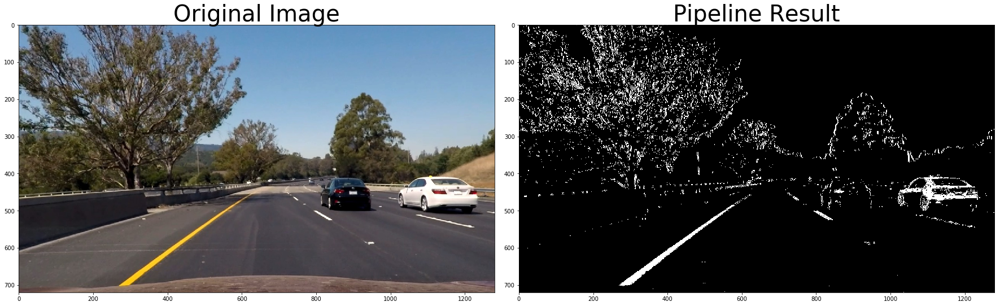

In [16]:
test_previous_pipeline1('test_images/test6.jpg')

### Applying mask to region of interest

In [17]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image


def apply_mask(img):
    imshape = img.shape
    vertices = np.array([[
        (0, imshape[0]),
        (imshape[1]*0.5, imshape[0]*0.57), 
        (imshape[1]*0.5, imshape[0]*0.57), 
        (imshape[1], imshape[0]),
    ]], dtype=np.int32)
    img = region_of_interest(img, vertices)
    return img

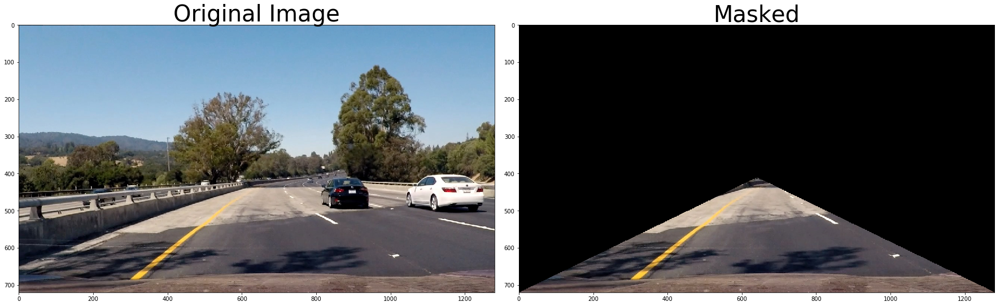

In [18]:
img_to_mask = cv2.imread('test_images/test4.jpg')
img_to_mask = cv2.cvtColor(img_to_mask,cv2.COLOR_BGR2RGB)
masked_image = apply_mask(img_to_mask)

#Plotting
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img_to_mask)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(masked_image)
ax2.set_title('Masked', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Applying perspective transform

In [19]:
original_pts = np.array([
    [244,  702],
    [595,  450],
    [685,  450],
    [1046, 702]], 
    np.float32)
dst_pts = np.array([
    [400,  702],
    [400,  100],
    [880, 100],
    [880, 702]], 
    np.float32)

M = cv2.getPerspectiveTransform(original_pts, dst_pts)



In [20]:
def warp(img):
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    return warped

In [21]:
def test_previous_pipeline2(fname):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB)
    undistorted = cal_undistort(test_img)
    binary_img = to_binary_img(undistorted)
    
    color_binary = np.dstack((np.zeros_like(binary_img), binary_img, (np.zeros_like(binary_img)))) * 255
    cv2.polylines(color_binary,[original_pts.astype(int)],True,(255,0,0),3)
    
    masked_binary = apply_mask(binary_img)
    warped_binary= warp(masked_binary)

    color_warped = np.dstack((np.zeros_like(warped_binary), warped_binary, (np.zeros_like(warped_binary)))) * 255
    cv2.polylines(color_warped,[dst_pts.astype(int)],True,(0,0,255),3)

    #Plotting
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(color_binary)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(color_warped)
    ax2.set_title('Perspective Transform Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

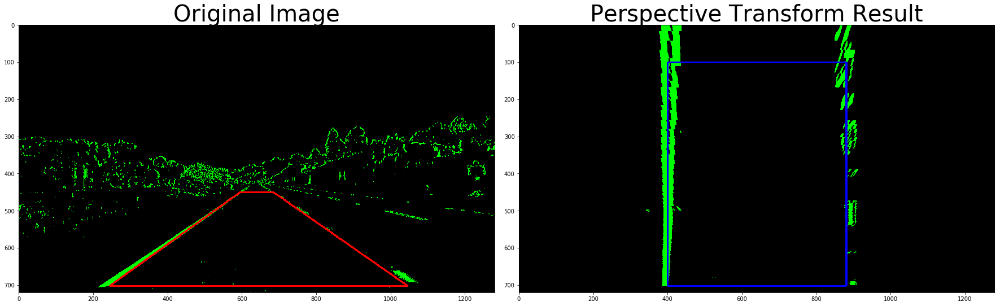

In [22]:
test_previous_pipeline2('test_images/straight_lines1.jpg')

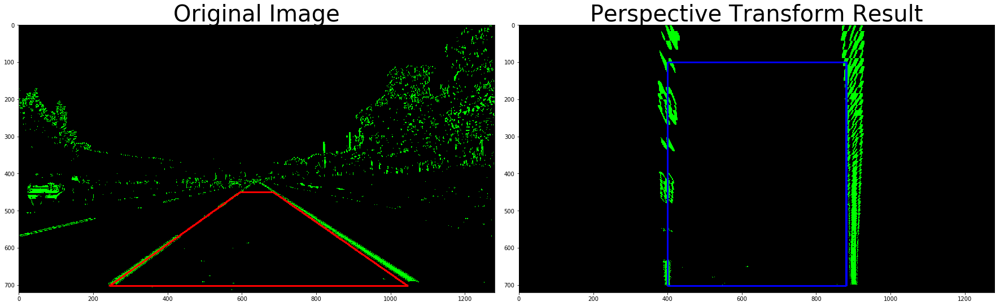

In [23]:
test_previous_pipeline2('test_images/straight_lines2.jpg')

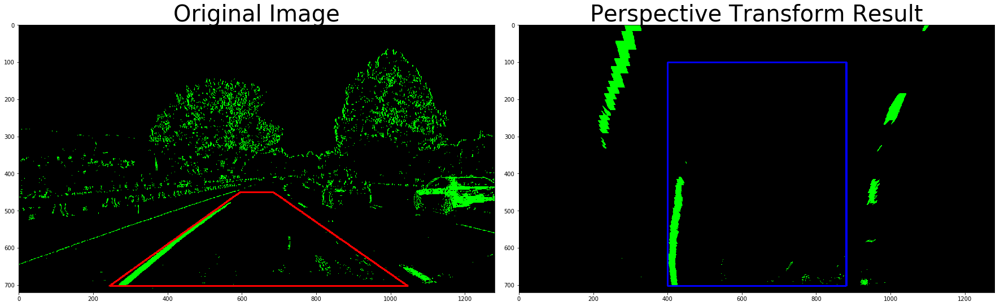

In [24]:
test_previous_pipeline2('test_images/test1.jpg')

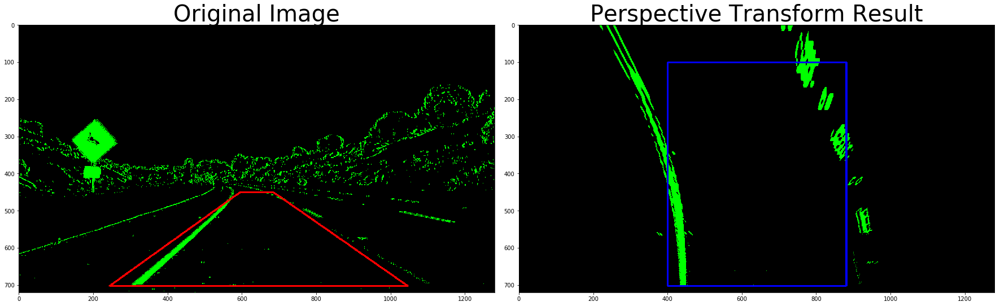

In [25]:
test_previous_pipeline2('test_images/test2.jpg')

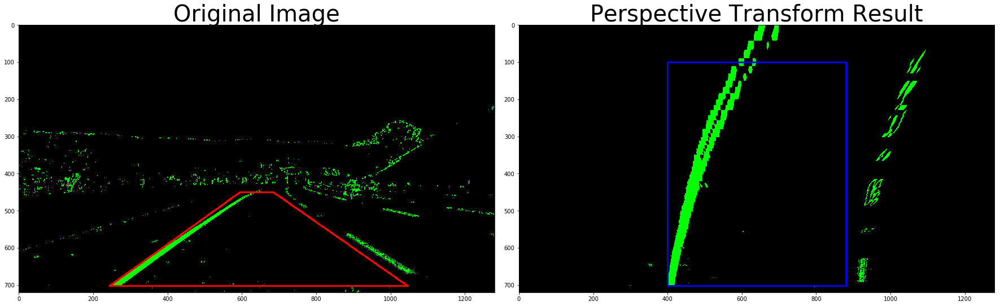

In [26]:
test_previous_pipeline2('test_images/test3.jpg')

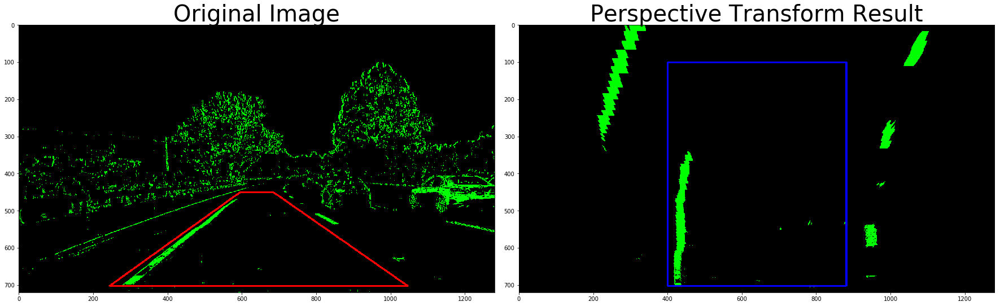

In [27]:
test_previous_pipeline2('test_images/test4.jpg')

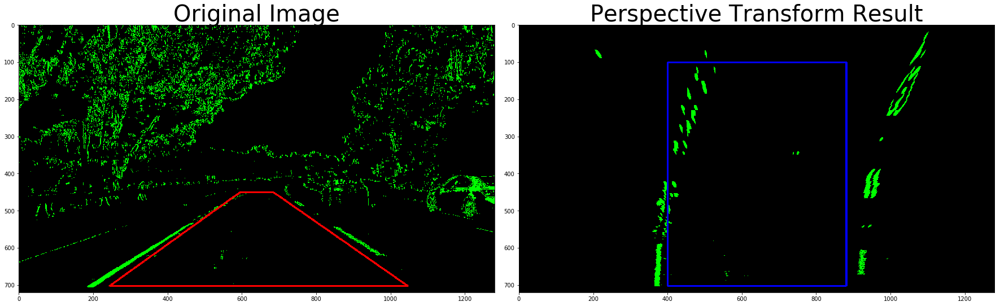

In [28]:
test_previous_pipeline2('test_images/test5.jpg')

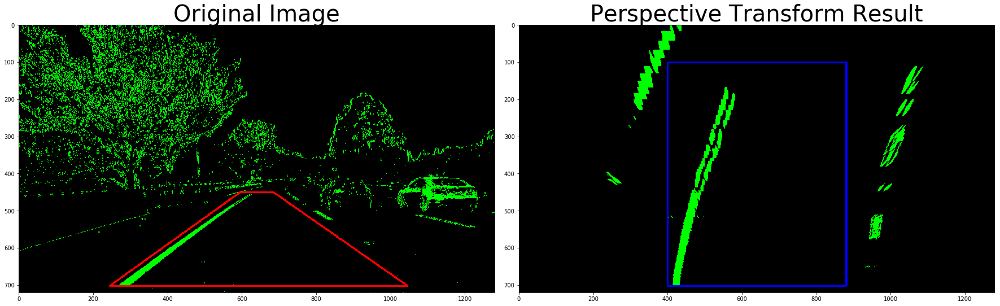

In [29]:
test_previous_pipeline2('test_images/test6.jpg')

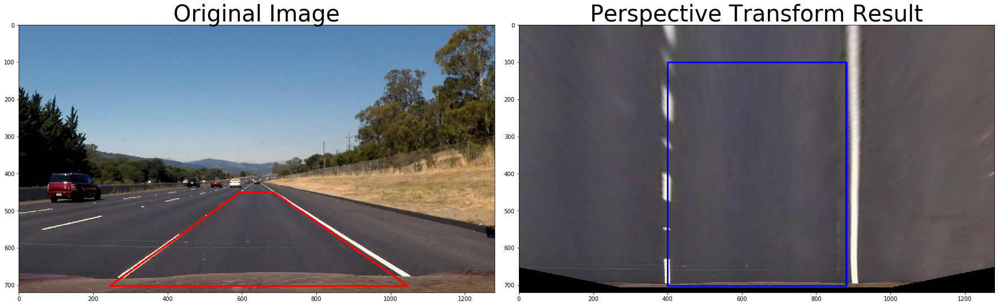

In [30]:
color_test = np.copy(test_img)
cv2.polylines(color_test,[original_pts.astype(int)],True,(255,0,0),3)

warped_test= warp(test_img)

cv2.polylines(warped_test,[dst_pts.astype(int)],True,(0,0,255),3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(color_test)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped_test)
ax2.set_title('Perspective Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

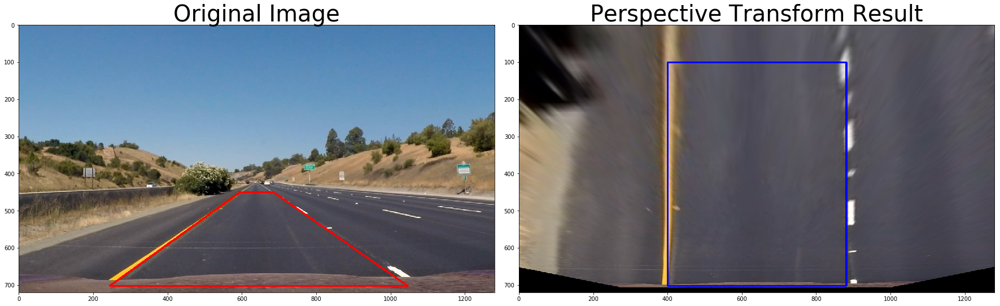

In [31]:
color_test2 = cv2.imread('test_images/straight_lines1.jpg')
color_test2 = cv2.cvtColor(color_test2,cv2.COLOR_BGR2RGB)
warped_test2 = warp(color_test2)

cv2.polylines(color_test2,[original_pts.astype(int)],True,(255,0,0),3)
cv2.polylines(warped_test2,[dst_pts.astype(int)],True,(0,0,255),3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(color_test2)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped_test2)
ax2.set_title('Perspective Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

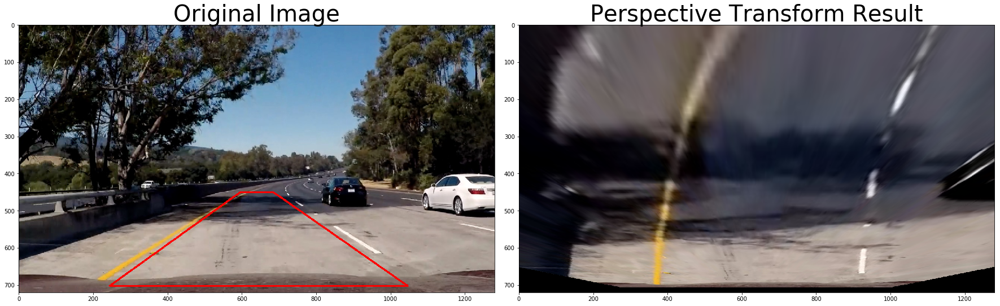

In [32]:
color_curve = cv2.imread('test_images/test5.jpg')
color_curve = cv2.cvtColor(color_curve,cv2.COLOR_BGR2RGB)
warped_curve= warp(color_curve)

cv2.polylines(color_curve,[original_pts.astype(int)],True,(255,0,0),3)
cv2.polylines(warped_test,[dst_pts.astype(int)],True,(0,0,255),3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(color_curve)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped_curve)
ax2.set_title('Perspective Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

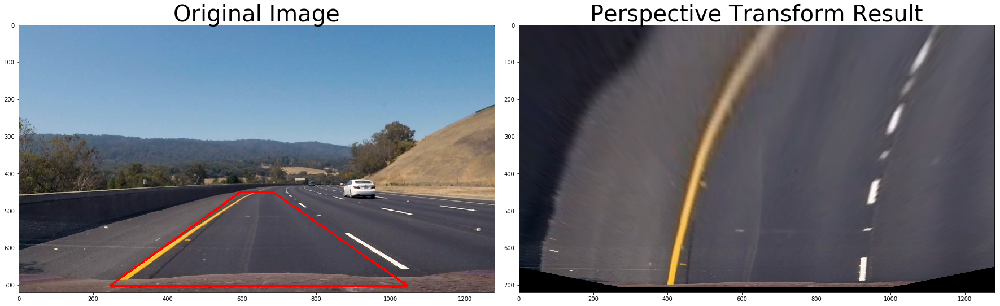

In [33]:
color_curve = cv2.imread('test_images/test3.jpg')
color_curve = cv2.cvtColor(color_curve,cv2.COLOR_BGR2RGB)
warped_curve= warp(color_curve)

cv2.polylines(color_curve,[original_pts.astype(int)],True,(255,0,0),3)
cv2.polylines(warped_test,[dst_pts.astype(int)],True,(0,0,255),3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(color_curve)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped_curve)
ax2.set_title('Perspective Transform Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Finding lane:Histogram

In [34]:
def hist(img):
    # Grab only the bottom third of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//3:,:]

    #  Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram


In [36]:
def hist_bases(histogram): 
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return [leftx_base, rightx_base], [histogram[leftx_base], histogram[rightx_base]]

In [38]:

def find_lane_pixels(binary_warped):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    #get bases
    histogram = hist(binary_warped)
    bases, bases_values = hist_bases(histogram)
    
    #TODO: validate bases. 
    # * values at bases: if one too low, ignore it (maybe try to define the window from the previous one) 
    # * distance between bases: if too low or big, ignore the smallest one. 
    
    # Create an output image to draw on and visualize the result
    # out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
   
    left_rectangles = []
    right_rectangles = []

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = bases[0]
    rightx_current = bases[1]

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        
        #
        win_xleft_low =  leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        
        left_rectangles.append([[win_xleft_low,win_y_low],[win_xleft_high,win_y_high]])
        right_rectangles.append([[win_xright_low,win_y_low],[win_xright_high,win_y_high]])
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = (
            (nonzeroy >= win_y_low) & 
            (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) & 
            (nonzerox < win_xleft_high)
            ).nonzero()[0]
            
        
       
        good_right_inds = (
            (nonzeroy >= win_y_low) & 
            (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) & 
            (nonzerox < win_xright_high)
            ).nonzero()[0]
        
       
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        
        
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return (leftx, lefty, rightx, righty, left_rectangles, right_rectangles)


def fit_polynomial(binary_warped):
    leftx, lefty, rightx, righty, left_rectangles, right_rectangles = find_lane_pixels(binary_warped)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return (left_fit, right_fit, leftx, lefty, rightx, righty, left_rectangles, right_rectangles)



In [39]:
def calc_poly_in_shape(img, left_fit, right_fit):
    # Generate x and y values for plotting
    img_shape = img.shape
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = (left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2])
    right_fitx = (right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2])
    
    return left_fitx, right_fitx, ploty

In [40]:
def plot_binary_with_lanes(warped_binary, left_fit, right_fit, leftx, lefty, rightx, righty, left_rectangles=None, right_rectangles=None):
    #Create image to manipulate
    out_img = np.dstack((warped_binary, warped_binary, warped_binary))
    #Draw search lane windows
    if left_rectangles is not None:
        for [[win_xleft_low,win_y_low],[win_xleft_high,win_y_high]] in left_rectangles:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 3) 

    if right_rectangles is not None:
        for [[win_xright_low,win_y_low],[win_xright_high,win_y_high]] in right_rectangles:
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

    left_fitx, right_fitx, ploty = calc_poly_in_shape(warped_binary, left_fit, right_fit)

    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    plt.imshow(out_img)
    

In [42]:
def search_around_poly(binary_warped, left_fit, right_fit, margin = 100):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    
    left_lane_inds = (
        (nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy +  left_fit[2] - margin)) & 
        (nonzerox < (left_fit[0]*(nonzeroy**2) +  left_fit[1]*nonzeroy + left_fit[2] + margin))
    )
    right_lane_inds = (
        (nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +  right_fit[2] - margin)) & 
        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin))
    )
    
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit =  np.polyfit(lefty, leftx, 2)
    right_fit =  np.polyfit(righty, rightx, 2)
    
    return (left_fit, right_fit, leftx, lefty, rightx, righty)


### Joining previous steps
Get polynomial fit from image, using one of the two options depending on whether a previous fit is available

In [43]:
def getfit(img, prev_left_fit=None, prev_right_fit=None):
    undistorted = cal_undistort(img)
    binary_img = to_binary_img(undistorted)
    warped_binary = warp(binary_img)
    if prev_left_fit is not None:
        left_fit, right_fit, leftx, lefty, rightx, righty = search_around_poly(warped_binary, left_fit, right_fit, margin)
    if prev_left_fit is None:
        left_fit, right_fit, leftx, lefty, rightx, righty, left_rectangles, right_rectangles = fit_polynomial(warped_binary)
    return left_fit, right_fit, leftx, lefty, rightx, righty

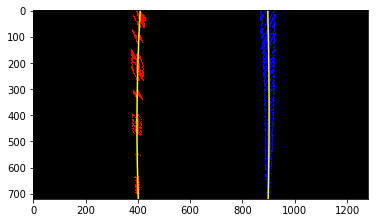

In [44]:
img = cv2.imread('test_images/straight_lines2.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


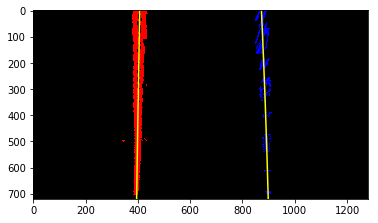

In [45]:
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)

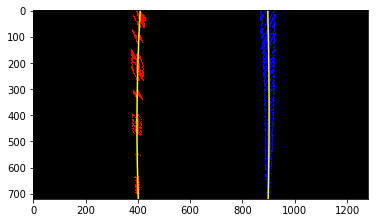

In [46]:
img = cv2.imread('test_images/straight_lines2.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


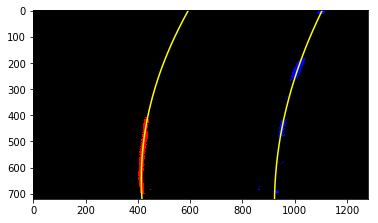

In [47]:
img = cv2.imread('test_images/test1.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


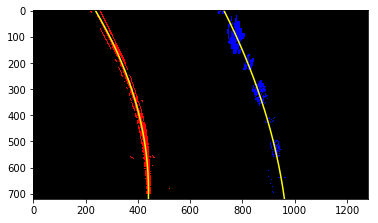

In [48]:
img = cv2.imread('test_images/test2.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


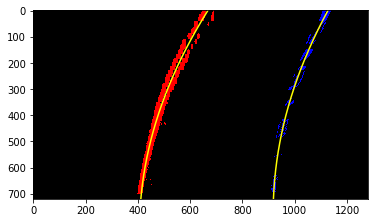

In [49]:
img = cv2.imread('test_images/test3.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


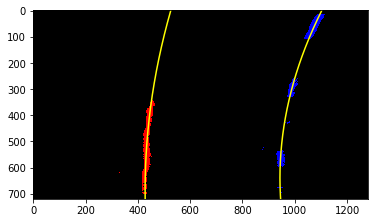

In [50]:
img = cv2.imread('test_images/test4.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


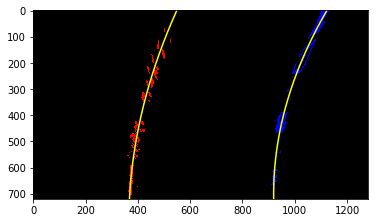

In [51]:
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


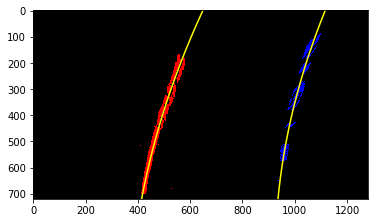

In [52]:
img = cv2.imread('test_images/test6.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
left_fit, right_fit, leftx, lefty, rightx, righty = getfit(img)
plot_binary_with_lanes(np.zeros_like(img[:, :, 0]), left_fit, right_fit, leftx, lefty, rightx, righty)


### Calculate radius


In [ ]:
def radius():
    return 0